In [1]:
# add ReinforcementLearning

#using ReinforcementLearning
using POMDPs
import POMDPs: solve, action
using POMDPModels # For the problem
using CommonRLInterface
using CommonRLInterface.Wrappers: Wrappers, AbstractWrapper
#using RockSample
#using LaserTag
using DroneSurveillance
using POMDPTools
using FIB # For the solver
using QMDP, DiscreteValueIteration
using BasicPOMCP
using ARDESPOT
using POMCPOW
#using PFTDPW
#using NaiveDESPOT
#using MCTS
using ReinforcementLearning 
using Distributions
using CUDA
using LaserTag
using VDPTag2
using RoombaPOMDPs

#include("pft/ParticleFilterTrees.jl")
using Revise

#push!(LOAD_PATH, "pft/")
#import ParticleFilterTrees
#using ParticleFilterTrees

#push!(LOAD_PATH, "deepq/")
#import DeepQLearning
#using DeepQLearning
#include("deepq/DeepQLearning.jl")

push!(LOAD_PATH, "ibmdp/")
import IBMDP
using IBMDP

push!(LOAD_PATH, "lightdark/")
import LightDark
using LightDark

push!(LOAD_PATH, "rocksample/")
import RockSample
using RockSample

push!(LOAD_PATH, "MCTS/")
import MCTS
using MCTS

#using .IPFT
using Flux
#using Flux: params
using ParticleFilters
#using TabularTDLearning
#using POMDPPolicies # For creating a random policy
#using POMDPSimulators
#using Plots
#using Flux: InvDecay
using Printf
using Random
using D3Trees
using POMDPGifs
using Cairo
using IntervalSets
using Gtk
#using AlphaZero

#push!(LOAD_PATH, "AlphaZero.jl-0.5.3/src/")
#import MyAlphaZero
#using MyAlphaZero

#include("FixedTigerEnv.jl")
print("Done!")
rng = MersenneTwister(7)

[ Info: Precompiling IBMDP [top-level]


Done!

MersenneTwister(7)

In [3]:
using Plots
using Statistics
pyplot() #hide

Plots.PyPlotBackend()

In [2]:
mutable struct MyWrapper{E} <: AbstractWrapper
    env::E
    max_steps::Int
    steps::Int
end

#MyWrapper(env, max_steps::Int, steps::Int=0) = MyWrapper(env, max_steps, steps)

MyWrapper(env, max_steps::Int) = MyWrapper(env, max_steps, 0)

Wrappers.wrapped_env(w::MyWrapper) = w.env

function CommonRLInterface.reset!(w::MyWrapper)
    w.steps = 0
    return CommonRLInterface.reset!(w.env)
end

function CommonRLInterface.act!(w::MyWrapper, a)
    w.steps += 1
    return CommonRLInterface.act!(w.env, a)  
end

CommonRLInterface.valid_action_mask(w::MyWrapper) = fill(true, length(CommonRLInterface.actions(w.env)))

function CommonRLInterface.terminated(w::MyWrapper)
    if w.steps >= w.max_steps
        return true
    else
        return CommonRLInterface.terminated(w.env)
    end
end

# For AlphaZero
CommonRLInterface.players(w::MyWrapper) = [1]

CommonRLInterface.player(w::MyWrapper) = 1

GI.heuristic_value(w::MyWrapper) = 0.0
GI.symmetries(w::MyWrapper) = GI.symmetrie(w.env)
GI.render(w::MyWrapper) = GI.render(w.env)
GI.action_string(w::MyWrapper, a) = "?"
GI.parse_action(w::MyWrapper, s) = nothing
GI.read_state(w::MyWrapper) = nothing

function GI.vectorize_state(w::MyWrapper, state)
    return state
end

function CommonRLInterface.clone(w::MyWrapper)
    cloned_env = CommonRLInterface.clone(w.env)
    return MyWrapper(cloned_env, w.max_steps, w.steps)
end

LoadError: UndefVarError: `GI` not defined

In [3]:
function getQval(bmdp, state, remaining_depth)
    Dnetwork = agent2.policy.learner.approximator.model
    s = POMDPs.convert_s(Array{Float32}, state, bmdp)
    return Dnetwork.val(Dnetwork.base(s))[1]
end

function getAction(bmdp::GenerativeBeliefMDP, state)
    Dnetwork = agent2.policy.learner.approximator.model
    s = POMDPs.convert_s(Array{Float32}, state, bmdp)
    act = Dnetwork.adv(Dnetwork.base(s))
    return POMDPs.actions(pomdp)[argmax(act)]
end

function getAction(pomdp::POMDP, belief)
    Dnetwork = agent2.policy.learner.approximator.model
    #act = Dnetwork.adv(Dnetwork.base([belief.o]))
    act = Dnetwork.adv(Dnetwork.base(belief.o))
    return POMDPs.actions(pomdp)[argmax(act)]
end

mutable struct DQNpolicy{RNG<:AbstractRNG, P<:Union{POMDP,MDP}, U<:Updater} <: POMDPs.Policy
    rng::RNG
    problem::P
    updater::U
end

DQNpolicy(problem::Union{POMDP,MDP};
          rng=Random.default_rng(),
          updater=IBMDP.PFTFilter(problem, 100)) = DQNpolicy(rng, problem, updater)

## policy execution ##
function POMDPs.action(policy::DQNpolicy, s)
    return getAction(policy.problem, s)
end

In [4]:
setup1 = [(1,5), (3,5), (5,5)]
setup2 = [(1,5), (3,1), (5,3)]
pomdp = RockSamplePOMDP(rocks_positions=setup2, 
                        sensor_efficiency=10.0,
                        discount_factor=0.99, 
                        good_rock_reward = 50.0,
                        bad_rock_penalty = -50.0,
                        exit_reward = 20.0,
                        step_penalty = -1.0,
                        sensor_use_penalty = -5.0);

In [22]:
setup3 = [(2,1), (2,3)]
pomdp = RockSamplePOMDP(rocks_positions=setup3, 
                        map_size=(3,3),
                        init_pos=[1,2],
                        sensor_efficiency=10.0,
                        discount_factor=0.99, 
                        good_rock_reward = 50.0,
                        bad_rock_penalty = -50.0,
                        exit_reward = 20.0,
                        step_penalty = -1.0,
                        sensor_use_penalty = -5.0);

In [103]:
pomdp = DroneSurveillancePOMDP();

In [70]:
pomdp = LightDark.LightDark1D(0.99, 100.0, -100.0, 1.0, -1.0, 0.1, POMDPModels.default_sigma);

In [5]:
#updater = DiscreteUpdater(pomdp);
updater1 = BasicParticleFilter(pomdp, ImportanceResampler(500), 500);
#updater2 = ParticleFilterTrees.PFTFilter(pomdp, 20);

updater3 = IBMDP.PFTFilter(pomdp, 100, 1);


ibmdp = GenerativeInformationBMDP(pomdp, updater3, 100.0, true);
common_env = POMDPTools.MDPCommonRLEnv(ibmdp)
common_env = MyWrapper(common_env, 100)
env = convert(ReinforcementLearningBase.AbstractEnv, common_env)
env = discrete2standard_discrete(env);

po_common_env = POMDPTools.POMDPCommonRLEnv(pomdp)
po_common_env = MyWrapper(po_common_env, 100)
po_env = convert(ReinforcementLearningBase.AbstractEnv, po_common_env)
po_env = discrete2standard_discrete(po_env);

ns, na = length(ReinforcementLearning.state(env)), length(ReinforcementLearning.action_space(env))

(6, 8)

In [10]:
ns, na = length(ReinforcementLearning.state(po_env)), length(ReinforcementLearning.action_space(po_env))

(3, 8)

In [22]:
ReinforcementLearning.state(po_env)

1-element Vector{Int64}:
 3

In [ ]:
PLAN_TIME = 1.0
deepQpolicy = DQNpolicy(rng, pomdp, updater3);
#solver = DPWSolver(depth=100, n_iterations=999999, max_time=PLAN_TIME, estimate_value=RolloutEstimator(RandomSolver(rng); max_depth=-1, eps=0.99))
#solver = MCTSSolver(exploration_constant=100.0, depth=30, n_iterations=999999, max_time=PLAN_TIME, estimate_value=MCTS.RolloutEstimator(RandomSolver(rng); max_depth=-1, eps=0.99))
#solver = MCTSSolver(depth=100, n_iterations=999999, max_time=PLAN_TIME, estimate_value=getQval)
#solver = MCTSSolver(depth=100, n_iterations=999999, max_time=PLAN_TIME, estimate_value=RolloutEstimator(deepQpolicy; max_depth=-1, eps=0.99))
#solver = deepq_solver
#solver = PFTDPWSolver(tree_queries=9999999, max_depth = 100, max_time=PLAN_TIME, enable_action_pw=false, n_particles=100, check_repeat_obs=false)
#solver = POMCPOWSolver(tree_queries=9999999, max_depth = 100, max_time=PLAN_TIME, check_repeat_obs=false, default_action=rand(POMDPs.actions(pomdp)))
#solver = POMCPOWSolver(k_observation=1, alpha_observation=0.01, eps=0.00001, tree_queries=9999999, max_depth = 30, max_time=PLAN_TIME, check_repeat_obs=false, default_action=rand(POMDPs.actions(pomdp)), enable_action_pw=false)
solver =  POMCPSolver(c = 1.0, tree_queries=9999999, max_depth = 30, max_time=PLAN_TIME);


N = 100
hist_sim = HistoryRecorder(max_steps=100)
rewards = []
step_counts = []
for i in 1:N
    policy = solve(solver, pomdp);
    #policy = solve(solver, ibmdp)
    #policy = deepQpolicy
    #policy = POMDPTools.RandomPolicy(ibmdp)
    hist = POMDPs.simulate(hist_sim, pomdp, policy, updater3);
    #hist = simulate(hist_sim, ibmdp, policy);
    reward = 0.0
    steps = 0
    for (s,a,r) in eachstep(hist, "s,a,r")
    #@printf("state: %s, action: %s, belief: %s\n", s, a, b)
        #st = particle(s, argmax(weights(s)))
        #@printf("state: %s, action: %s, reward: %s\n", s, a, r)
        #@printf("action: %s, reward: %s\n", a, r)
        #if r != 0
            #println(r)
        #end
        #ibmdp.sense_steps -= 1

        reward += r
        steps += 1
    end
    #reward = simulate(rollout_sim, pomdp, pft_policy, updater);
    append!(rewards, reward)
    append!(step_counts, steps)
    print(i, " ")
end
println("")
@show mean(rewards);
@show std(rewards)/sqrt(length(rewards))
@show mean(step_counts)
@show std(step_counts)/sqrt(length(step_counts));

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67

In [17]:
sensor = Lidar() # or Bumper() for the bumper version of the environment
config = 3 # 1,2, or 3
#m = RoombaPOMDP(sensor=sensor, mdp=RoombaMDP(config=config));
m = pomdp
ibmdp = GenerativeInformationBMDP(m, updater3);
common_env = POMDPTools.MDPCommonRLEnv(ibmdp)
common_env = MyWrapper(common_env, 100)
env = convert(ReinforcementLearningBase.AbstractEnv, common_env);
#env = discrete2standard_discrete(env)

In [41]:
states = []
rewards = []
PLAN_TIME = 1.0
solver = MCTSSolver(enable_tree_vis=true, exploration_constant=1.0, depth=20, n_iterations=999999, max_time=PLAN_TIME, estimate_value=MCTS.RolloutEstimator(RandomSolver(rng); max_depth=-1, eps=0.99))
#solver = POMCPOWSolver(k_observation=1, alpha_observation=0.1, tree_in_info=true, max_depth=30, tree_queries=9999999, max_time=PLAN_TIME, default_action=rand(POMDPs.actions(pomdp)))
policy = solve(solver, ibmdp)
#policy = solve(solver, pomdp)
#policy = deepQpolicy
hist = POMDPs.simulate(hist_sim, pomdp, policy, updater3);
#hist = POMDPs.simulate(hist_sim, ibmdp, policy);
for (a,s,r) in eachstep(hist, "a,s,r")
    append!(states, s.y)
    append!(rewards, r)
    @printf("action: %s, reward: %s\n", a, r)
end
println(sum(rewards))
println(length(rewards))

LoadError: type RSState has no field y

In [128]:
state = rand(rng, initialstate(ibmdp))
a = action(policy, state)

a, info = action_info(policy, state)
D3Tree(info[:tree], init_expand=2)

o: <root>
N: 247449    

├──a: 0
│  N: 3       V: -100      
│  ├──o: -15.152331368153845
│  │  N: 0         

│  └──o: 12.745512496938739
│     N: 0         

├──a: -10
│  N: 247439  V: -42.8     
│  ├──o: 2.344967228931024
│  │  N: 66926     

│  │  ├──a: 0
│  │  │  N: 620     V: -40        (2 children)
│  │  ├──a: -10
│  │  │  N: 1       V: -100       (1 children)
│  │  ├──a: 1
│  │  │  N: 1       V: -100       (1 children)
│  │  ├──a: 10
│  │  │  N: 1       V: -100       (1 children)
│  │  └──a: -1
│  │     N: 66303   V: -36.1      (4 children)
│  ├──o: 2.399678504452119
│  │  N: 66845     

│  │  ├──a: 0
│  │  │  N: 11      V: -100       (2 children)
│  │  ├──a: -1
│  │  │  N: 66802   V: -55.3      (4 children)
│  │  ├──a: 1
│  │  │  N: 11      V: -100       (2 children)
│  │  ├──a: -10
│  │  │  N: 10      V: -100       (2 children)
│  │  └──a: 10
│  │     N: 11      V: -100       (2 children)
│  ├──o: 5.386034879826234
│  │  N: 66636     

│  │  ├──a: 1
│  │  │  N: 2       V: -100       (2 children)
│  │  ├──a: -10
│  │  │  N: 66628   V: -39.1      (4 children)
│  │  ├──a: -1
│  │  │  N: 3       V: -100       (2 children)
│  │  ├──a: 0
│  │  │  N: 2       V: -100       (2 children)
│  │  └──a: 10
│  │     N: 1       V: -100       (1 children)
│  └──o: 0.19747669727081707
│     N: 47028     

│     ├──a: 10
│     │  N: 1       V: -100       (1 children)
│     ├──a: -10
│     │  N: 2       V: -100       (2 children)
│     ├──a: 1
│     │  N: 47023   V: -36.8      (3 children)
│     ├──a: -1
│     │  N: 1       V: -100       (1 children)
│     └──a: 0
│        N: 1       V: -100       (1 children)
├──a: 1
│  N: 3       V: -100      
│  ├──o: 7.946263356094062
│  │  N: 0         

│  └──o: 1.6205877338297703
│     N: 1         

│     └──a: -10
│        N: 1       V: -100       (1 children)
├──a: -1
│  N: 3       V: -100      
│  ├──o: 12.503866662646896
│  │  N: 0         

│  └──o: 5.025206131466218
│     N: 1         

│     └──a: 1
│        N: 1       V: -100       (1 children)
└──a: 10
   N: 1       V: -100      
   └──o: 34.11367793702414
      N: 0

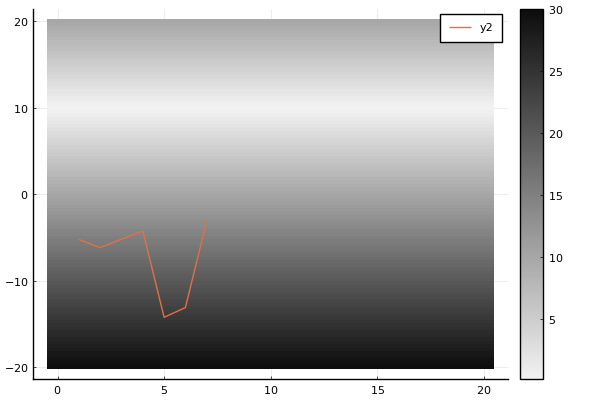

In [27]:
function f(x, y)
    return abs(y - 10)
end
x = range(0, 20)
y = range(-20, 20, length = 100)
heatmap(x, y, f, c = cgrad(:grays, rev = true))
plot!(states)

In [37]:
#Notables: 132, 
#rm("out.gif")
#solver = MCTSSolver(depth=100, n_iterations=99999999999, max_time=1.0, estimate_value=RolloutEstimator(RandomSolver(rng); max_depth=-1, eps=0.99))
#solver = POMCPOWSolver(tree_queries=9999999, max_depth = 100, max_time=1.0, check_repeat_obs=false, default_action=rand(POMDPs.actions(pomdp)))
deepQpolicy = DQNpolicy(rng, pomdp, updater3);
sim = GifSimulator(filename="normal-smolb.gif", max_steps=100)
#POMDPs.simulate(sim, pomdp, solve(solver, ibmdp), updater3)
POMDPs.simulate(sim, pomdp, deepQpolicy, updater3)

Simulating... 100%|██████████████████████████████████████| Time: 0:00:01
Rendering 3 steps... 100%|███████████████████████████████| Time: 0:00:04
[ Info: Creating Gif...
[ Info: Done Creating Gif.


POMDPGifs.SavedGif("normal-smolb.gif")

In [65]:
using BSON

In [67]:
polnet = agent2.policy.learner.approximator.model
polstate = Flux.state(polnet)

LoadError: UndefVarError: `state` not defined

In [11]:
Light_Dark_params = [32, 0.005, 32, 250_000]
Rock_Sample_A_params = [32, 0.005, 32, 250_000]
Rock_Sample_B_params = [100, 0.0005, 32, 2_000_000]

4-element Vector{Float64}:
 100.0
   0.0005
  32.0
   2.0e6

# DQN <-> RockSample


Progress: 100%|█████████████████████████████████████████| Time: 0:03:487:28


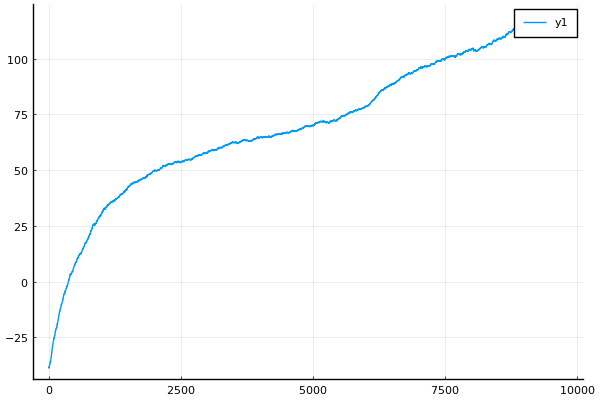

In [18]:
params = Light_Dark_params
USE_GPU = false
seed = 123
rng = MersenneTwister(7)
ns, na = length(ReinforcementLearning.state(env)), length(ReinforcementLearning.action_space(env))
RLBase.reset!(env)
hidden_dim = convert(Int, params[1])
steps = convert(Int, params[4])

agent2 = Agent(
    policy = QBasedPolicy(
        learner = DQNLearner(
            approximator = NeuralNetworkApproximator(
                model = DuelingNetwork(
                    base = Chain(
                        #RNN(ns, 2, relu, init = glorot_uniform(rng)),
                        Dense(ns, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, div(hidden_dim,2), leakyrelu; init = glorot_uniform(rng)),
                        #Dense(div(hidden_dim,2), div(hidden_dim,4), leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, hidden_dim, relu; init = glorot_uniform(rng)),
                    ),
                    val = Dense(hidden_dim, 1; init = glorot_uniform(rng)),
                    adv = Dense(hidden_dim, na; init = glorot_uniform(rng)),
                ),
                optimizer = ADAM(params[2]),
            #) |> gpu,
            ),
            target_approximator = NeuralNetworkApproximator(
                model = DuelingNetwork(
                    base = Chain(
                        #RNN(ns, 2, relu, init = glorot_uniform(rng)),
                        Dense(ns, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, div(hidden_dim,2), leakyrelu; init = glorot_uniform(rng)),
                        #Dense(div(hidden_dim,2), div(hidden_dim,4), leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, hidden_dim, relu; init = glorot_uniform(rng)),
                    ),
                    val = Dense(hidden_dim, 1; init = glorot_uniform(rng)),
                    adv = Dense(hidden_dim, na; init = glorot_uniform(rng)),
                ),
                optimizer = ADAM(params[2]),
            #) |> gpu,
            ),
            loss_func = Flux.Losses.huber_loss,
            stack_size = nothing,
            batch_size = convert(Int, params[3]),
            update_horizon = 2,
            min_replay_history = 1000,
            update_freq = 1,
            target_update_freq = 1000,
            rng = rng,
        ),
        explorer = EpsilonGreedyExplorer(
            kind = :linear,
            ϵ_stable = 0.01,
            decay_steps = steps-20_000,
            #decay_steps = steps,
            #warmup_steps = 20_000,
            rng = rng,
        ),
    ),
    trajectory = CircularArraySARTTrajectory(
        capacity = div(steps, 5),
        state = Vector{Float32} => (ns,),
        #state =  CuArray{Float32} => (ns,),
    ),
)

stop_condition = StopAfterStep(steps, is_show_progress=!haskey(ENV, "CI"))


hook = TotalRewardPerEpisode(is_display_on_exit = false)
#hook = StepsPerEpisode()S
ex = ReinforcementLearning.Experiment(agent2, env, stop_condition, hook, "# DQN <-> RockSample")
run(ex);
#n = minimum(map(length, ex.hook.rewards))
#m = mean([@view(x[1:n]) for x in ex.hook.rewards])
#s = std([@view(x[1:n]) for x in ex.hook.rewards])
moving_average(vs,n) = [sum(@view vs[i:(i+n-1)])/n for i in 1:(length(vs)-(n-1))]
plot(moving_average(ex.hook.rewards,1000))

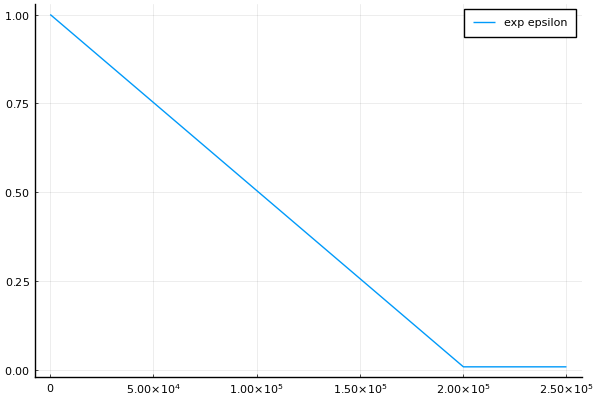

In [17]:
s_exp = EpsilonGreedyExplorer(
            kind = :linear,
            ϵ_stable = 0.01,
            decay_steps = steps - 50_000,
            rng = rng,
        )
plot([RLCore.get_ϵ(s_exp, i) for i in 1:250_000], label="exp epsilon")

In [12]:
Light_Dark_params = [32, 0.005, 32, 250_000]
po_Light_Dark_params = [64, 0.001, 32, 1_000_000]
po_Rock_Sample_B_params = [100, 0.00025, 32, 5_000_000]

4-element Vector{Float64}:
 100.0
   0.00025
  32.0
   5.0e6

# DQN <-> RockSample


Progress: 100%|█████████████████████████████████████████| Time: 6:15:48


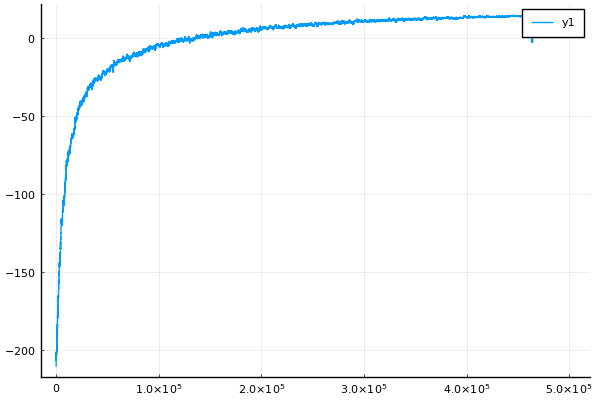

In [14]:
params = po_Rock_Sample_B_params
USE_GPU = false
seed = 123
rng = MersenneTwister(7)
ns, na = length(ReinforcementLearning.state(po_env)), length(ReinforcementLearning.action_space(po_env))
RLBase.reset!(po_env)
hidden_dim = convert(Int, params[1])
steps = convert(Int, params[4])

agent2 = Agent(
    policy = QBasedPolicy(
        learner = DQNLearner(
            approximator = NeuralNetworkApproximator(
                model = DuelingNetwork(
                    base = Chain(
                        #RNN(ns, 2, relu, init = glorot_uniform(rng)),
                        Dense(ns, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, div(hidden_dim,2), leakyrelu; init = glorot_uniform(rng)),
                        #Dense(div(hidden_dim,2), div(hidden_dim,4), leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, hidden_dim, relu; init = glorot_uniform(rng)),
                    ),
                    val = Dense(hidden_dim, 1; init = glorot_uniform(rng)),
                    adv = Dense(hidden_dim, na; init = glorot_uniform(rng)),
                ),
                optimizer = ADAM(params[2]),
            #) |> gpu,
            ),
            target_approximator = NeuralNetworkApproximator(
                model = DuelingNetwork(
                    base = Chain(
                        #RNN(ns, 2, relu, init = glorot_uniform(rng)),
                        Dense(ns, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, div(hidden_dim,2), leakyrelu; init = glorot_uniform(rng)),
                        #Dense(div(hidden_dim,2), div(hidden_dim,4), leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        Dense(hidden_dim, hidden_dim, leakyrelu; init = glorot_uniform(rng)),
                        #Dense(hidden_dim, hidden_dim, relu; init = glorot_uniform(rng)),
                    ),
                    val = Dense(hidden_dim, 1; init = glorot_uniform(rng)),
                    adv = Dense(hidden_dim, na; init = glorot_uniform(rng)),
                ),
                optimizer = ADAM(params[2]),
            #) |> gpu,
            ),
            loss_func = Flux.Losses.huber_loss,
            stack_size = nothing,
            batch_size = convert(Int, params[3]),
            update_horizon = 2,
            min_replay_history = 1000,
            update_freq = 1,
            target_update_freq = 1000,
            rng = rng,
        ),
        explorer = EpsilonGreedyExplorer(
            kind = :linear,
            ϵ_stable = 0.01,
            decay_steps = steps,
            #warmup_steps = 20_000,
            rng = rng,
        ),
    ),
    trajectory = CircularArraySARTTrajectory(
        capacity = div(steps, 5),
        state = Vector{Float32} => (ns,),
        #state =  CuArray{Float32} => (ns,),
    ),
)

stop_condition = StopAfterStep(steps, is_show_progress=!haskey(ENV, "CI"))


hook = TotalRewardPerEpisode(is_display_on_exit = false)
#hook = StepsPerEpisode()S
ex = ReinforcementLearning.Experiment(agent2, po_env, stop_condition, hook, "# DQN <-> RockSample")
run(ex);
#n = minimum(map(length, ex.hook.rewards))
#m = mean([@view(x[1:n]) for x in ex.hook.rewards])
#s = std([@view(x[1:n]) for x in ex.hook.rewards])
moving_average(vs,n) = [sum(@view vs[i:(i+n-1)])/n for i in 1:(length(vs)-(n-1))]
plot(moving_average(ex.hook.rewards,1000))